In [0]:
!pip install nltk
!pip install --upgrade pip
!python -m nltk.downloader all
!pip install squarify

     |████████████████████████████████| 1.5 MB 6.1 MB/s 
     |████████████████████████████████| 76 kB 8.2 MB/s 
     |████████████████████████████████| 97 kB 9.1 MB/s 
     |████████████████████████████████| 764 kB 53.6 MB/s 
You should consider upgrading via the '/databricks/python3/bin/python -m pip install --upgrade pip' command.
     |████████████████████████████████| 2.1 MB 6.2 MB/s 
  Attempting uninstall: pip
    Found existing installation: pip 21.0.1
    Uninstalling pip-21.0.1:
      Successfully uninstalled pip-21.0.1
/usr/lib/python3.8/runpy.py:127: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
  warn(RuntimeWarning(msg))
[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/abc.zip.
[nltk_data]    | Downloading package alpino to /root/nltk_da

# Universidad Nacional Autónoma de México
## Instituto de Investigaciones en Matemáticas Aplicadas y en Sistemas
### Datos Masivos I; mini proyecto I 
#### Nolasco Cabello, Ayala Salcedo, Andrés Urbano, Fuentes Cruz.

In [0]:
# Importando las librarías y cargando los datos;
import pyspark
from pyspark.sql.functions import * 
from pyspark.sql import SparkSession
spark = SparkSession.builder.appName('MiniProyecto').getOrCreate()
import numpy as np
import matplotlib.pyplot as plt
import nltk
import string
import re
import squarify 
from string import digits
from nltk.corpus import stopwords
from string import punctuation
yahoo_RDD = spark.sparkContext.textFile('/FileStore/tables/test.csv')
yahoo_RDD.take(1)

Out[3]: ['"9","What makes friendship click?","How does the spark keep going?","good communication is what does it.  Can you move beyond small talk and say what\'s really on your mind.  If you start doing this, my expereince is that potentially good friends will respond or shun you.  Then you know who the really good friends are."']

La base de datos con la que se desarolló el presente trabajo ha sido recopilado de Yahoo Respuestas, y tiene como fin la clasificación de preguntas de acuerdo a categorías. Estas categorías son; Sociedad y Cultura, Ciencia y Matemáticas, Salud, Educación, Computación e Internet, Deportes, Negocios y Finanzas, Entretenimiento y Música, Familia y Relaciones y Política y Gobierno.

En cuanto a las características del dataset, este está compuesto por cuatro campos;

1.- Categoría a la que corresponde la pregunta. Se representa con un número del 1 al 10.

2.- Título de la pregunta. 

3.- Contenido de la pregunta. Aborda una explicación más amplia de la pregunta formulada.

4.- Mejor respuesta. Se ha considerado únicamente la respuesta más popular como la mejor respuesta.

## Preprocesamiento de los datos

Debido a la manera en que se creó la base de datos, esta presenta símbolos de saltos de línea, mismos que serán removidos. 

Además de esto, se propone estandarizar las palabras, es decir, convertir toda cadena a minúscula. Posteriormente, se eliminarán los signos de puntuación, así como extraer la categoría de cada registro. 

Más adelante se añadirán o modificarán más el tratamiento de los datos con el fin de nutrir la información y obtener mejores resultados.

In [0]:
def preprocessing(record):
    """
    Función que preprocesa registros de un RDD.
    El preprocesamiento consiste en; pasar toda la cadena
    a minúsculas, eliminar puntuación, encontrar la categoría de cada registro,
    separar por palabras y eliminar la categoría del registro.
    
    Input: Registro de RDD de la forma ("categoría", "pregunta", "contenido", "respuesta")
    Output: Devuelve una tupla de la forma (categoría, oración separada que contiene la pregunta, el contenido y la respuesta). 
    """
    record = record.lower()
    for pun in punctuation:
        record = record.replace(pun,"")
    category = re.findall("(10|\d{1})", record)[0]
    record = record.split(" ")
    record[0] = re.sub("\d+", "", record[0])
    record = [i for i in record if i]
    return category, record
words = yahoo_RDD.map(preprocessing) #Aplicamos el preprocesamiento a los datos
words.take(1)

Out[4]: [('9',
  ['what',
   'makes',
   'friendship',
   'clickhow',
   'does',
   'the',
   'spark',
   'keep',
   'goinggood',
   'communication',
   'is',
   'what',
   'does',
   'it',
   'can',
   'you',
   'move',
   'beyond',
   'small',
   'talk',
   'and',
   'say',
   'whats',
   'really',
   'on',
   'your',
   'mind',
   'if',
   'you',
   'start',
   'doing',
   'this',
   'my',
   'expereince',
   'is',
   'that',
   'potentially',
   'good',
   'friends',
   'will',
   'respond',
   'or',
   'shun',
   'you',
   'then',
   'you',
   'know',
   'who',
   'the',
   'really',
   'good',
   'friends',
   'are'])]

## Propuesta de trabajo;

Para el conjunto de datos propuesto y las características del mismo, se propone el siguiente esquema de trabajo;


### Contar las palabras más frecuentes en todo el dataset.

In [0]:
#Para ello se emplea un flatMap sobre la oración separada, seguido de un mapreduce
mostfreqwords = words.flatMap(lambda x : nltk.FreqDist(x[1]).most_common()).map(lambda x: x).reduceByKey(lambda x,y : x+y).sortBy(lambda x: x[1], ascending = False)
mostfreqwords.take(10)

Out[5]: [('the', 227024),
 ('to', 152608),
 ('and', 130577),
 ('a', 128794),
 ('of', 102972),
 ('is', 93871),
 ('you', 90880),
 ('i', 89679),
 ('in', 78126),
 ('it', 64379)]

Se puede observar que las primeras 10 palabras más frecuentes en todo el dataset son, de hecho, stepwords.

### Eliminando stepwords

In [0]:
#Utilizamos filter para quedarnos con aquellas palabras que no son stopwords y pertenecen a todo el documento
nostopwords = mostfreqwords.filter(lambda x: x[0] not in stopwords.words("english"))

Ahora, volvemos a mostrar las palabras más frecuentes en todo el documento sin tener en consideración las stepwords.

In [0]:
nostopwords.take(10)

Out[77]: [('like', 18543),
 ('get', 18346),
 ('would', 17060),
 ('one', 15980),
 ('know', 15712),
 ('dont', 14964),
 ('think', 12477),
 ('people', 12354),
 ('want', 11249),
 ('good', 10604)]

### Representación gráfica de los datos

Para dimensionar y comparar la cantidad de palabras más frecuentes en el documento se realiza el siguiente histograma:

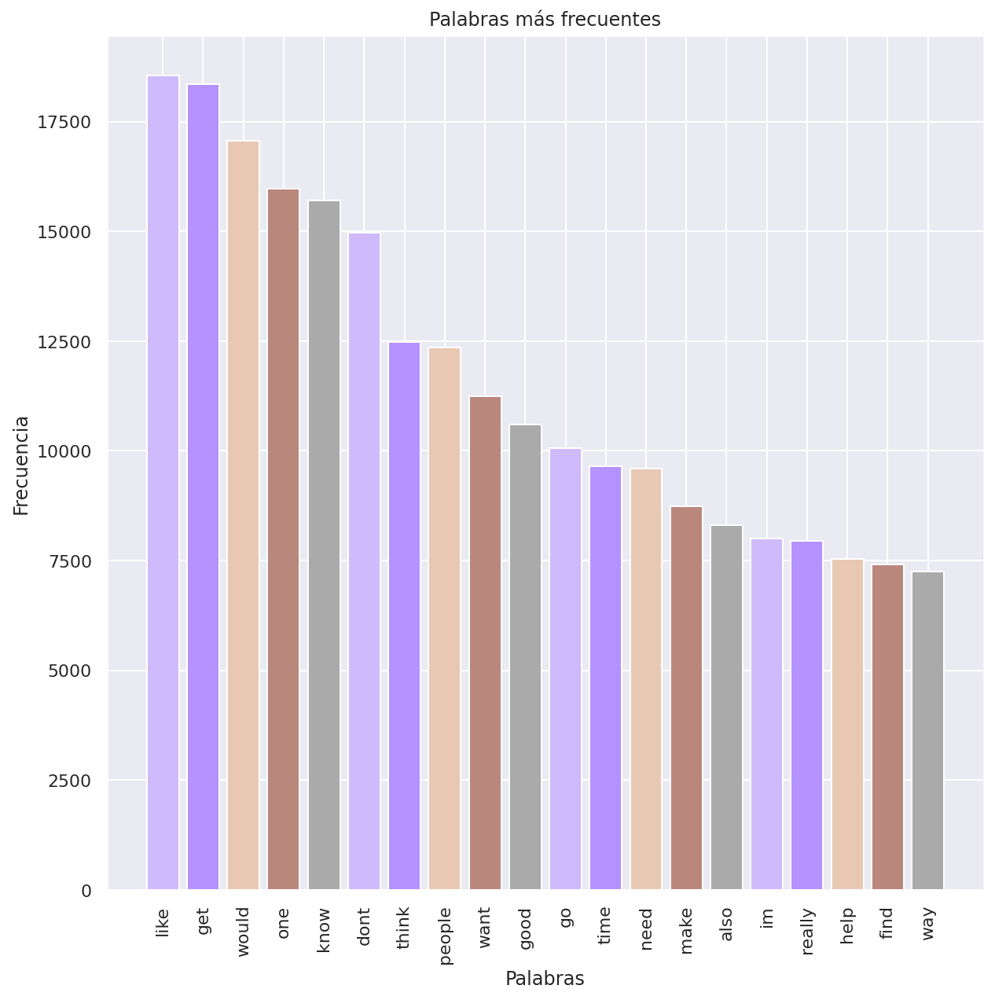

In [0]:
#Importamos seaborn para darle una mejor visualización a las gráficas
import seaborn as sns
sns.set()
%config InlineBackend.figure_format = 'retina'

fig, axs = plt.subplots(1,1,figsize=(10,10))

#Creamos el histograma con las 20 primeras palabras que más se repiten en todo el documento
histograma = nostopwords.take(20)

numeros = [ numero for (numero, _) in histograma ]
frecuencias = [ frecuencia for (_, frecuencia) in histograma ]
plt.bar(numeros, frecuencias, color = ["#cfbafb", "#b492ff", "#e8c8b3", "#b9877c", "#aaaaaa"])
plt.xlabel('Palabras')
plt.xticks(rotation=90)
plt.ylabel('Frecuencia')
plt.title("Palabras más frecuentes")
plt.show()

### Filtrado de las palabras por longitud

Con el fin de conocer la distribución de la longitud de las palabras en el documento, se procede a realizar un map reduce sobre las palabras más frecuentes sin considerar stepwords.

In [0]:
#Realizamos un map-reduce para contar por longitud de palabra
ngrams = mostfreqwords.map(lambda x: (len(x[0]),1)).reduceByKey(lambda a,b: a+b).sortBy(lambda x: x[0], ascending = True)

A continuación, se presenta gráficamente el resultado obtenido

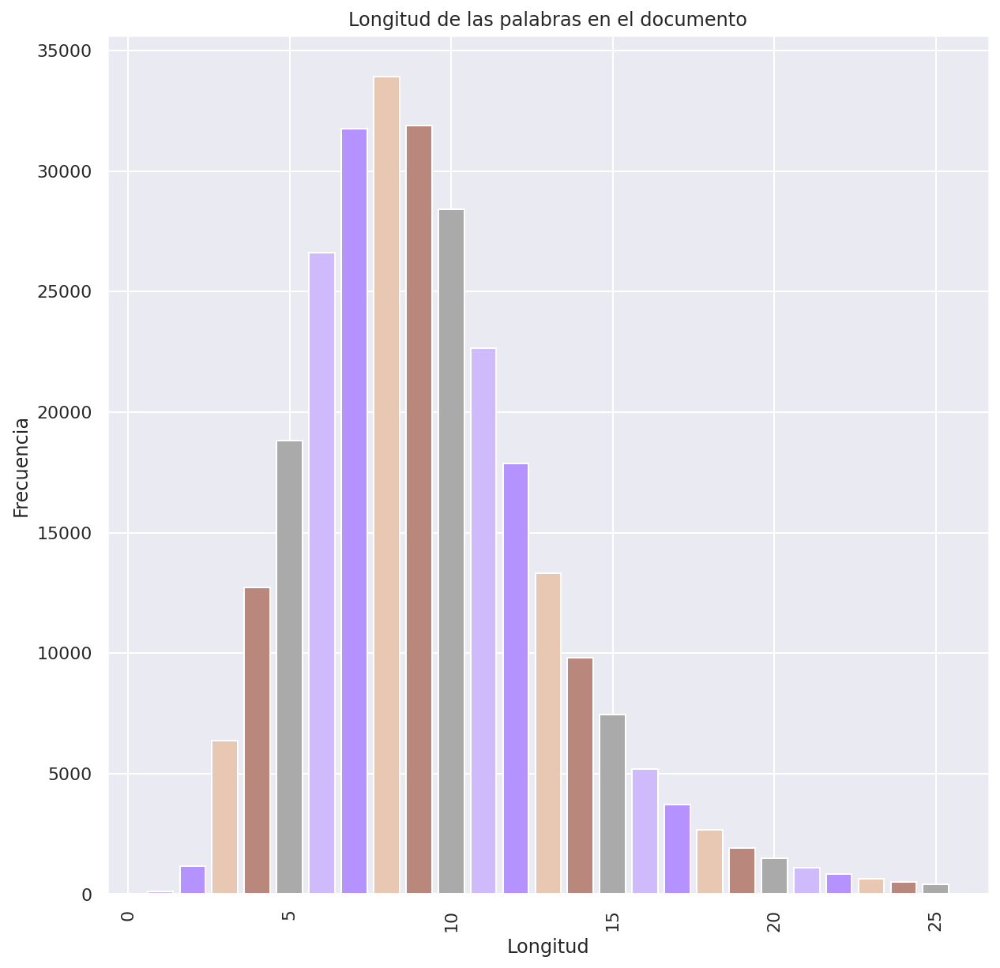

In [0]:
fig, axs = plt.subplots(1,1,figsize=(10,10))
histograma = ngrams.take(25)

numeros = [ numero for (numero, _) in histograma ]
frecuencias = [ frecuencia for (_, frecuencia) in histograma ]
plt.bar(numeros, frecuencias, color = ["#cfbafb", "#b492ff", "#e8c8b3", "#b9877c", "#aaaaaa"])
plt.xlabel('Longitud')
plt.xticks(rotation=90)
plt.ylabel('Frecuencia')
plt.title("Longitud de las palabras en el documento")
plt.show()

### Distribución de las categorías en el conjunto de datos

Con el fin de obtener más información acerca del dataset, se procede a evaluar la cantidad de preguntas por categoría en el dataset.

In [0]:
#Reducimos el número de tuplas (categoría, oración separada) por categoría
freqcategory = words.map(lambda x: (x[0],1)).reduceByKey(lambda a,b: a+b).sortBy(lambda x: int(x[0]), ascending = True)

Gráficamente los resultados toman la siguiente forma;

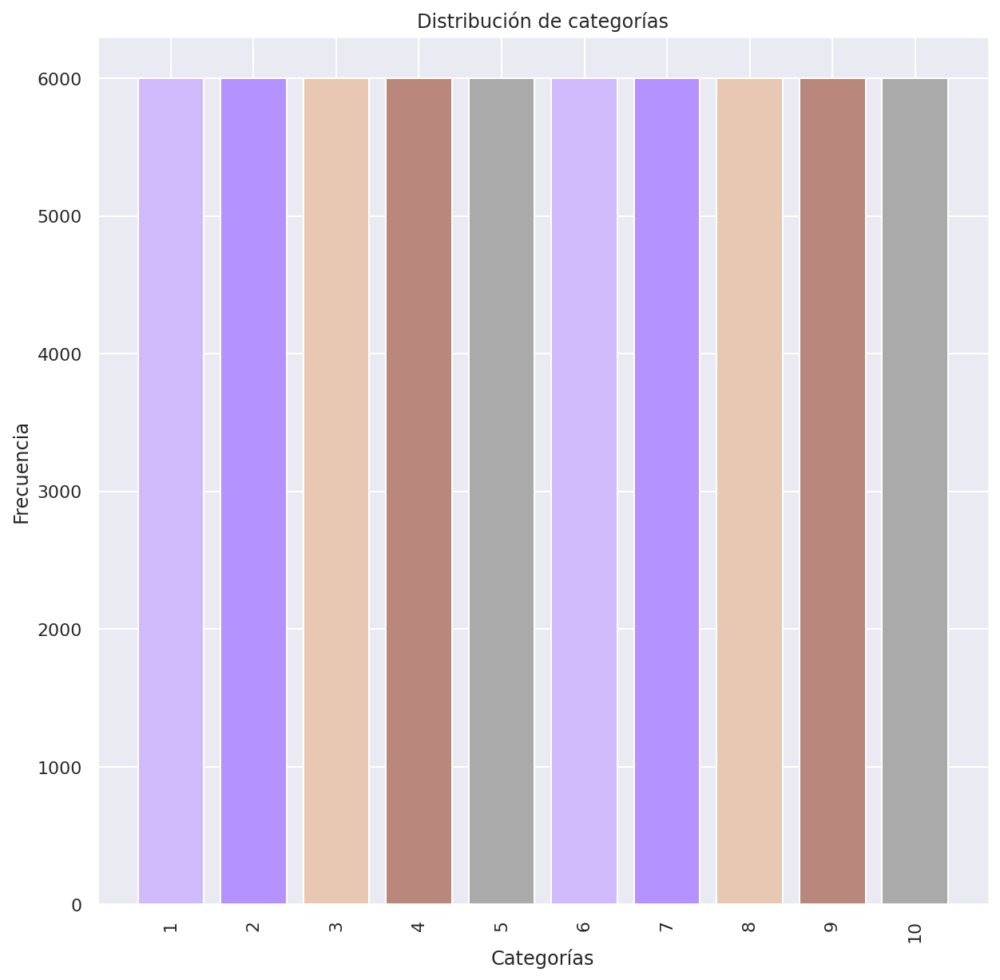

In [0]:
# Posteriormente, dada la frecuencia de las categorías, podemos crear el histograma;
fig, axs = plt.subplots(1,1,figsize=(10,10))
histograma = freqcategory.collect()

numeros = [ numero for (numero, _) in histograma ]
frecuencias = [ frecuencia for (_, frecuencia) in histograma ]
plt.bar(numeros, frecuencias, color = ["#cfbafb", "#b492ff", "#e8c8b3", "#b9877c", "#aaaaaa"])
plt.xlabel('Categorías')
plt.xticks(rotation=90)
plt.ylabel('Frecuencia')
plt.title("Distribución de categorías")
plt.show()

### Palabras más frecuentes por categoría

Con el fin de obtener información de valor, se ha analizado el conjunto de datos a nivel de categoría. Como primer paso, se muestran las palabras más frecuentes por categoría. 

Previo a realizar el punto anterior, se procede a implementar una pequeña función auxiliar cuyo objetivo es eliminar las stepwords de los registros originales.

In [0]:
def nostopwords(x):
    """Función que elimina stopwords del idioma inglés. 
    Input: tuple (categoría, oración separada por palabras)
    Output: tuple (categoría, lista de palabras que no son stepwords)
    """
    filtered = [] #Creamos una lista
    for word in x[1]:
        if word not in stopwords.words("english"):
            filtered.append(word) #Sólo si resulta no ser un stopword, se agrega a la lista
    return (x[0],filtered) #Devolvemos la categoría y la oración sin stopword

Con el fin de ser lo más claro posibles, se muestra el proceso con el cual se obtienen las palabras más frecuentes únicamente para la cateogría 1. 
Posteriormente se procederá a generalizar este raciocinio para toda categoría.

In [0]:
#Obtenemos las palabras más frecuentes para la categoría 1
mostfreqbycategory = words.filter(lambda x: x[0] == "1").map(nostopwords)

#Se evalúa un map-reduce
ngrams_category1 = mostfreqbycategory.flatMap(lambda x : nltk.FreqDist(x[1]).most_common()).map(lambda x: x).reduceByKey(lambda x,y : x+y).sortBy(lambda x: x[1], ascending = False)

nostopwords_category1 = ngrams_category1.filter(lambda x: x[0] not in stopwords.words("english"))

Resultados:

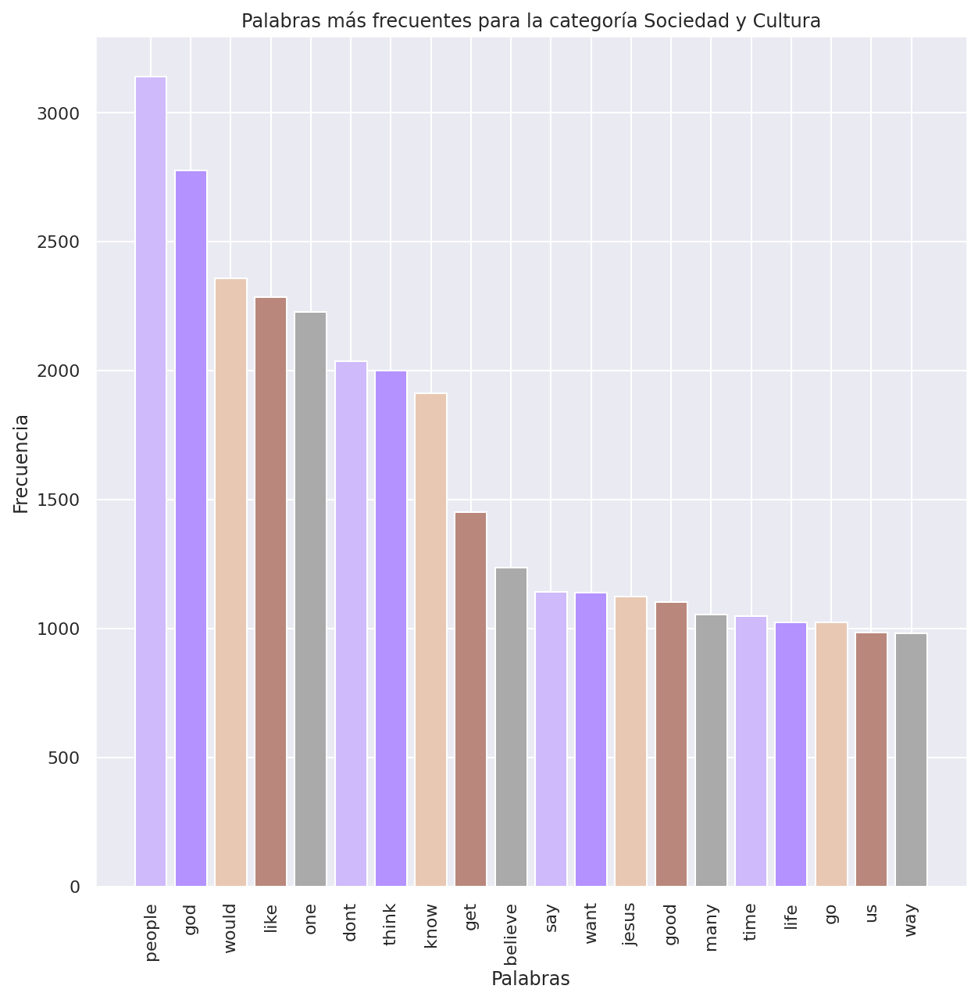

In [0]:
#Una vez que se tienen las palabras más frecuentes en la primera categoría, se crea su histograma
fig, axs = plt.subplots(1,1,figsize=(10,10))
histograma = nostopwords_category1.take(20)

numeros = [ numero for (numero, _) in histograma ]
frecuencias = [ frecuencia for (_, frecuencia) in histograma ]
plt.bar(numeros, frecuencias, color = ["#cfbafb", "#b492ff", "#e8c8b3", "#b9877c", "#aaaaaa"])
plt.xlabel('Palabras')
plt.xticks(rotation=90)
plt.ylabel('Frecuencia')
plt.title("Palabras más frecuentes para la categoría Sociedad y Cultura")
plt.show()

### Longitud de las palabras por categoría

Para poseer un perfil más completo de las categorías, a continuación se presenta la distribución de la longitud de las palabras en la categoría 1;

In [0]:
#A partir de los resultados anteriores, se procede a clasificar por longitud de palabras
dist_ngrams_category1 = nostopwords_category1.map(lambda x: (len(x[0]),1))
dist_ngrams_category1 = dist_ngrams_category1.reduceByKey(lambda a,b: a+b).sortBy(lambda x: x[0], ascending = True)

Y se recrean los resultados en un histograma:

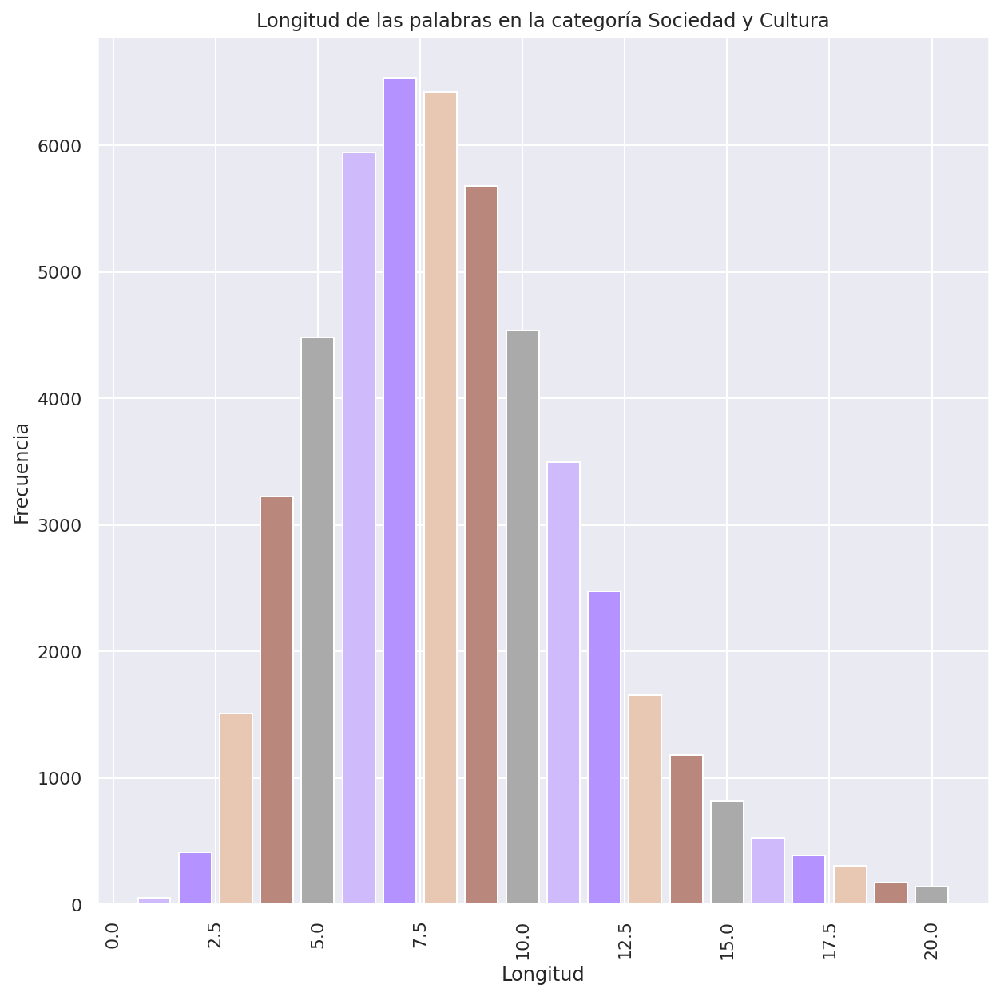

In [0]:
#Y se crea su histograma
fig, axs = plt.subplots(1,1,figsize=(10,10))
histograma = dist_ngrams_category1.take(20)

numeros = [ numero for (numero, _) in histograma ]
frecuencias = [ frecuencia for (_, frecuencia) in histograma ]
plt.bar(numeros, frecuencias, color = ["#cfbafb", "#b492ff", "#e8c8b3", "#b9877c", "#aaaaaa"])
plt.xlabel('Longitud')
plt.xticks(rotation=90)
plt.ylabel('Frecuencia')
plt.title("Longitud de las palabras en la categoría Sociedad y Cultura")
plt.show()

### Generalización de los puntos anteriores

El siguiente paso es generalizar el proceso anterior pero ahora teniendo en consideración cada una de las categorías

Obtención de las palabras más frecuentes por categoría:

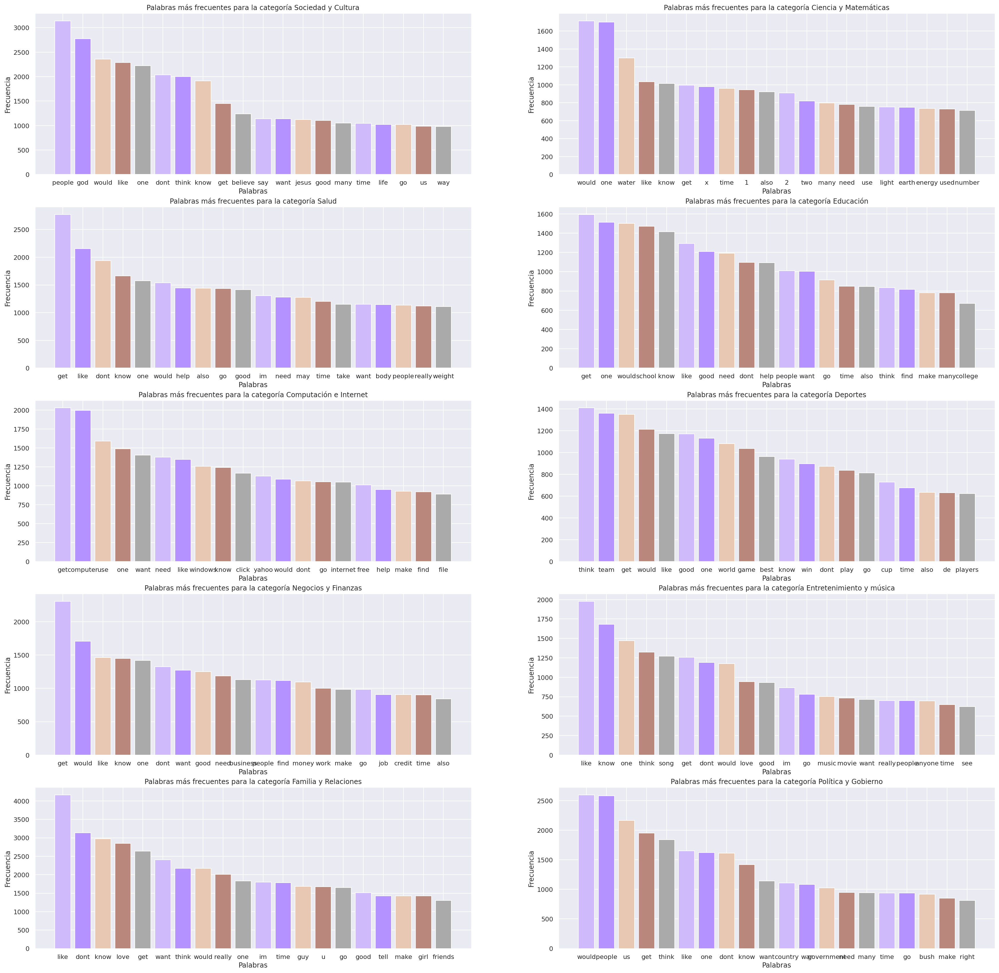

In [0]:
# Creamos subplots que contendra cada histograma
fig, axs = plt.subplots(5,2,figsize=(30,30))
j = 1

#Lista de categorías
categories = ["Sociedad y Cultura", "Ciencia y Matemáticas", "Salud", "Educación", "Computación e Internet", 
              "Deportes", "Negocios y Finanzas", "Entretenimiento y música", "Familia y Relaciones", "Política y Gobierno"]

#Se salvan datos que se emplearán más adelante
no_stop_words_category_list = []
most_freq_by_category_list = []
for i in range(10):
    if i >= 2*j:
        j += 1
    
    # Filtramos por cada categoria y eliminamos los stopwords 
    mostfreqbycategory_n = words.filter(lambda x: x[0] == f"{i+1}").map(nostopwords)
    ngrams_category_n = mostfreqbycategory_n.flatMap(lambda x : nltk.FreqDist(x[1]).most_common()).map(lambda x: x).reduceByKey(lambda x,y : x+y).sortBy(lambda x: x[1], ascending = False)
    
    most_freq_by_category_list.append(ngrams_category_n)
    
    nostopwords_category_n = ngrams_category_n.filter(lambda x: x[0] not in stopwords.words("english"))
    
    no_stop_words_category_list.append(nostopwords_category_n)
    
    # Cremos un histograma 
    histograma = nostopwords_category_n.collect()[:20]
    numeros = [ numero for (numero, _) in histograma ]
    frecuencias = [ frecuencia for (_, frecuencia) in histograma ]
    
    axs[j-1][i%2].bar(numeros, frecuencias, color = ["#cfbafb", "#b492ff", "#e8c8b3", "#b9877c", "#aaaaaa"])
    axs[j-1][i%2].set_xlabel('Palabras')
    axs[j-1][i%2].set_ylabel('Frecuencia')
    axs[j-1][i%2].set_title(f"Palabras más frecuentes para la categoría {categories[i]}")

Y posteriormente, se estudian las distribuciones de las longitudes de las palabras por categoría;

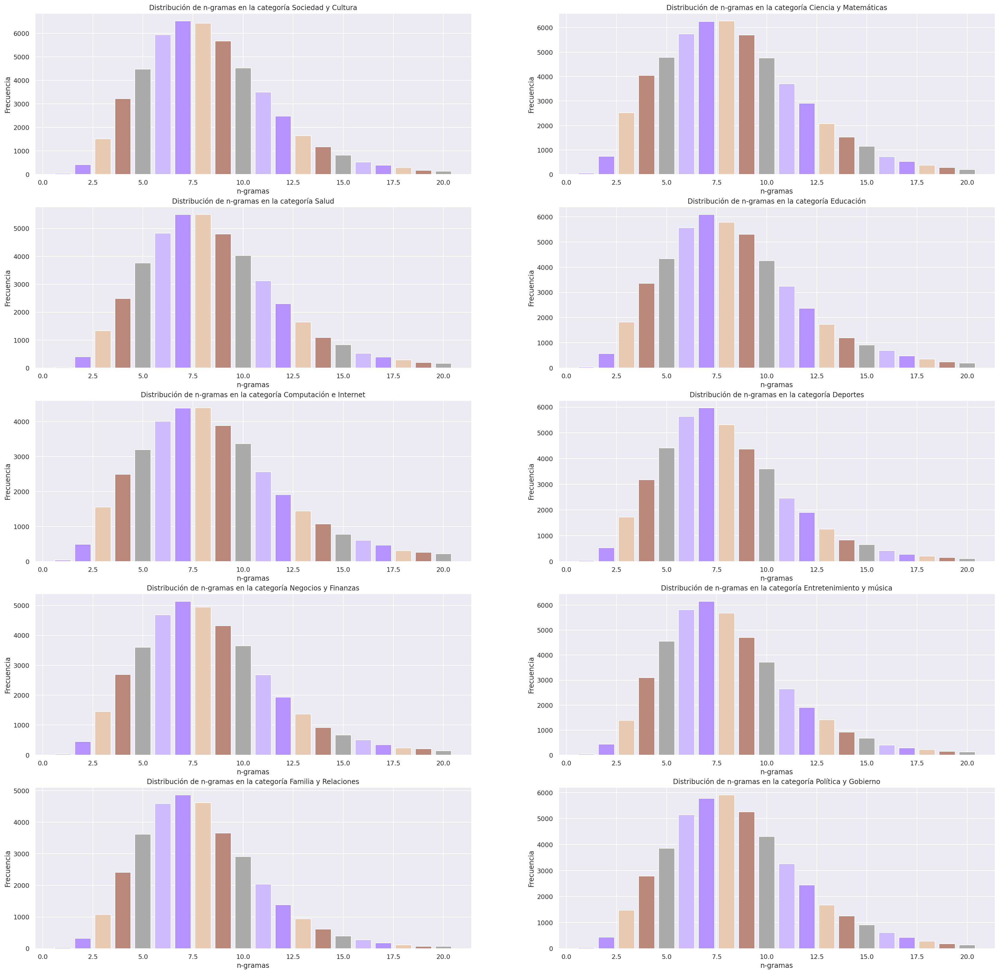

In [0]:
#En general, podemos obtener la distribución de la longitud de las palabras por cada categoría
#De la siguiente forma;
fig, axs = plt.subplots(5,2,figsize=(30,30))
j = 1
for i in range(10):
    if i >= 2*j:
        j += 1
        
    nostopwords_category_n = no_stop_words_category_list[i]
    
    dist_ngrams_category_n = nostopwords_category_n.map(lambda x: (len(x[0]),1))
    dist_ngrams_category_n = dist_ngrams_category_n.reduceByKey(lambda a,b: a+b).sortBy(lambda x: x[0], ascending = True)
    
    
    histograma = dist_ngrams_category_n.collect()[:20]

    numeros = [ numero for (numero, _) in histograma ]
    frecuencias = [ frecuencia for (_, frecuencia) in histograma ]
    
    axs[j-1][i%2].bar(numeros, frecuencias, color = ["#cfbafb", "#b492ff", "#e8c8b3", "#b9877c", "#aaaaaa"])
    axs[j-1][i%2].set_xlabel('n-gramas')
    axs[j-1][i%2].set_ylabel('Frecuencia')
    axs[j-1][i%2].set_title(f"Distribución de n-gramas en la categoría {categories[i]}")

### Bigramas más frecuentes

Podemos estudiar los bigramas (compuestos por dos letras) más frecuentes en cada categoría, cuyos resultados se han resumido como sigue:

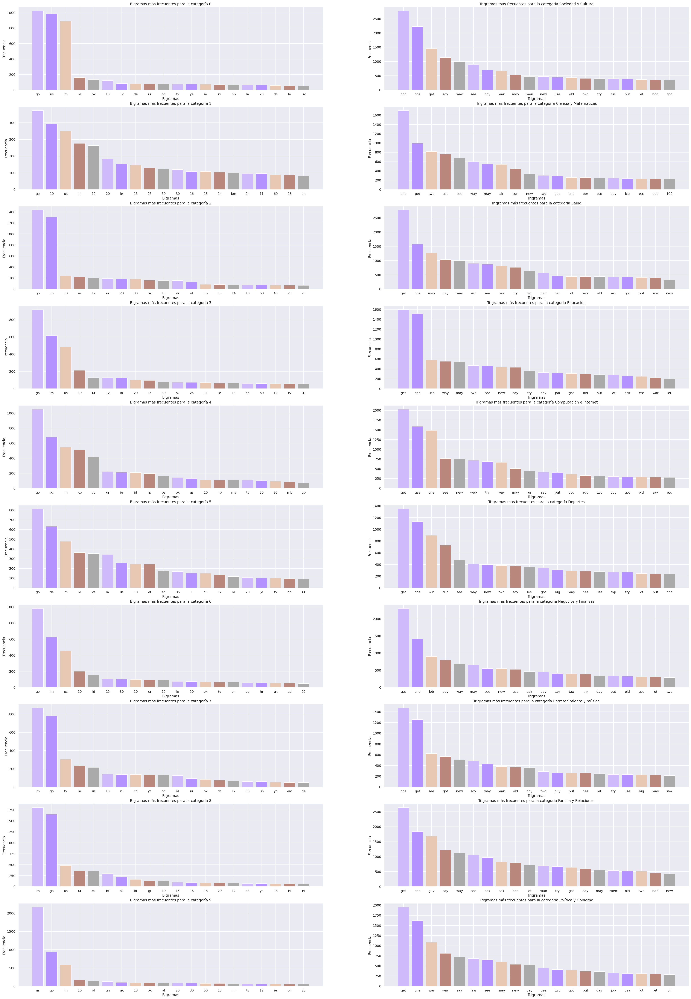

In [0]:
#Creación del mosaico
fig, axs = plt.subplots(10,2,figsize=(40,60))
j = 1
for i in range(10):
    if i >= 2*j:
        j += 1
    
    #Obtención de bigramas y trigramas por categoría
    
    freq_words_n = most_freq_by_category_list[i]
    categoryn_bigrams = freq_words_n.filter(lambda x: len(x[0]) == 2).sortBy(lambda x: x[1], ascending=False)
    categoryn_trigrams = freq_words_n.filter(lambda x: len(x[0]) == 3).sortBy(lambda x: x[1], ascending=False)
    
    
    histograma1 = categoryn_bigrams.collect()[:20]
    histograma2 = categoryn_trigrams.collect()[:20]
    
    numeros1 = [ numero for (numero, _) in histograma1 ]
    numeros2 = [ numero for (numero, _) in histograma2 ]
    
    frecuencias1 = [ frecuencia for (_, frecuencia) in histograma1 ]
    frecuencias2 = [ frecuencia for (_, frecuencia) in histograma2 ]
    
    axs[i][0].bar(numeros1, frecuencias1, color = ["#cfbafb", "#b492ff", "#e8c8b3", "#b9877c", "#aaaaaa"])
    axs[i][0].set_xlabel('Bigramas')
    axs[i][0].set_ylabel('Frecuencia')
    axs[i][0].set_title(f"Bigramas más frecuentes para la categoría {i}")
    
    axs[i][1].bar(numeros2, frecuencias2, color = ["#cfbafb", "#b492ff", "#e8c8b3", "#b9877c", "#aaaaaa"])
    axs[i][1].set_xlabel('Trigramas')
    axs[i][1].set_ylabel('Frecuencia')
    axs[i][1].set_title(f"Trigramas más frecuentes para la categoría {categories[i]}")

## Bigramas y Trigramas por palabras más Frecuentes por Categoría

Un mejor estudio del vocabulario empleado por cada categoría sería estudiar a los bigramas y trigramas como conjuntos de dos y tres palabras, respectivamente.

Para lograr la tarea fijada, se procede a implementar un par de funciones que ayudarán a crear conjuntos de dos y tres palabras.

In [0]:
def nostopwords_ngrams(x):
    """Función que elimina stopwords del idioma inglés. 
    Input: oración separada por palabras
    Output: lista de palabras que no son stepwords)
    """
    filtered = [] #Creamos una lista
    for word in x:
        if word not in stopwords.words("english"):
            filtered.append(word) #Sólo si resulta no ser un stopword, se agrega a la lista
    return filtered #Devolvemos  la oración sin stopword

In [0]:
def preprocessing_bigrams(record):
    """
    Función que agrupa un registro en conjuntos de dos palabras.
    
    Input: registro de RDD compuesto por categoría y una cadena de palabras. 
    Output: tupla de la forma (categoría, lista de conjuntos de dos palabras)
    """
    record = record.lower()
    for pun in punctuation:
        record = record.replace(pun,"")
    category = re.findall("(10|\d{1})", record)[0]
    record = record.split(" ")
    
    record[0] = re.sub("\d+", "", record[0])
    record = [i for i in record if i]
    record = nostopwords_ngrams(record)
    
    record = list(zip(record[:-1],record[1:]))
    
    # Concatenación de  palabras para formar bigramas
    record = [x[0]+" "+x[1] for x in record]
    return category, record

#Evaluamos la función
bigram  = yahoo_RDD.map(preprocessing_bigrams)

Análogamente para generar trigramas se presenta la siguiente función;

In [0]:
def preprocessing_trigram(record):
    """
    Función que agrupa un registro en conjuntos de tres palabras.
    
    Input: registro de RDD compuesto por categoría y una cadena de palabras. 
    Output: tupla de la forma (categoría, lista de conjuntos de tres palabras)
    """
    record = record.lower()
    for pun in punctuation:
        record = record.replace(pun,"")
    category = re.findall("(10|\d{1})", record)[0]
    record = record.split(" ")
    
    record[0] = re.sub("\d+", "", record[0])
    record = [i for i in record if i]
    record = nostopwords_ngrams(record)
    #  Concatenación de  palabras para formar trigramas
    record = list(zip(record[:-2],record[1:-1],record[2:]))
    record = [x[0]+" "+x[1]+" "+x[2] for x in record]
    return category, record

#Se evalúa la función
trigram  = yahoo_RDD.map(preprocessing_trigram)

De este modo, las salidas de las funciones poseen la siguiente forma;

In [0]:
bigram.take(1)

Out[36]: [('9',
  ['makes friendship',
   'friendship clickhow',
   'clickhow spark',
   'spark keep',
   'keep goinggood',
   'goinggood communication',
   'communication move',
   'move beyond',
   'beyond small',
   'small talk',
   'talk say',
   'say whats',
   'whats really',
   'really mind',
   'mind start',
   'start expereince',
   'expereince potentially',
   'potentially good',
   'good friends',
   'friends respond',
   'respond shun',
   'shun know',
   'know really',
   'really good',
   'good friends'])]

In [0]:
trigram.take(1)

Out[37]: [('9',
  ['makes friendship clickhow',
   'friendship clickhow spark',
   'clickhow spark keep',
   'spark keep goinggood',
   'keep goinggood communication',
   'goinggood communication move',
   'communication move beyond',
   'move beyond small',
   'beyond small talk',
   'small talk say',
   'talk say whats',
   'say whats really',
   'whats really mind',
   'really mind start',
   'mind start expereince',
   'start expereince potentially',
   'expereince potentially good',
   'potentially good friends',
   'good friends respond',
   'friends respond shun',
   'respond shun know',
   'shun know really',
   'know really good',
   'really good friends'])]

Antes de presentar los resultados, hemos de obtener los bigramas y trigramas más comunes por categoría. Para ello, se presenta el siguiente código;

In [0]:
most_freq_bis_list = []
most_freq_tris_list = []

for i in range(10):
    mostfreqbis = bigram.filter(lambda x: x[0] == f"{i+1}").flatMap(lambda x : nltk.FreqDist(x[1]).most_common()).map(lambda x: x).reduceByKey(lambda x,y : x+y).sortBy(lambda x: x[1], ascending = False)
    most_freq_bis_list.append(mostfreqbis)
    
    mostfreqtris = trigram.filter(lambda x: x[0] == f"{i+1}").flatMap(lambda x : nltk.FreqDist(x[1]).most_common()).map(lambda x: x).reduceByKey(lambda x,y : x+y).sortBy(lambda x: x[1], ascending = False)
    most_freq_tris_list.append(mostfreqtris)

Finalmente, se muestran los bigramas y trigramas más frecuentes para las categorías.

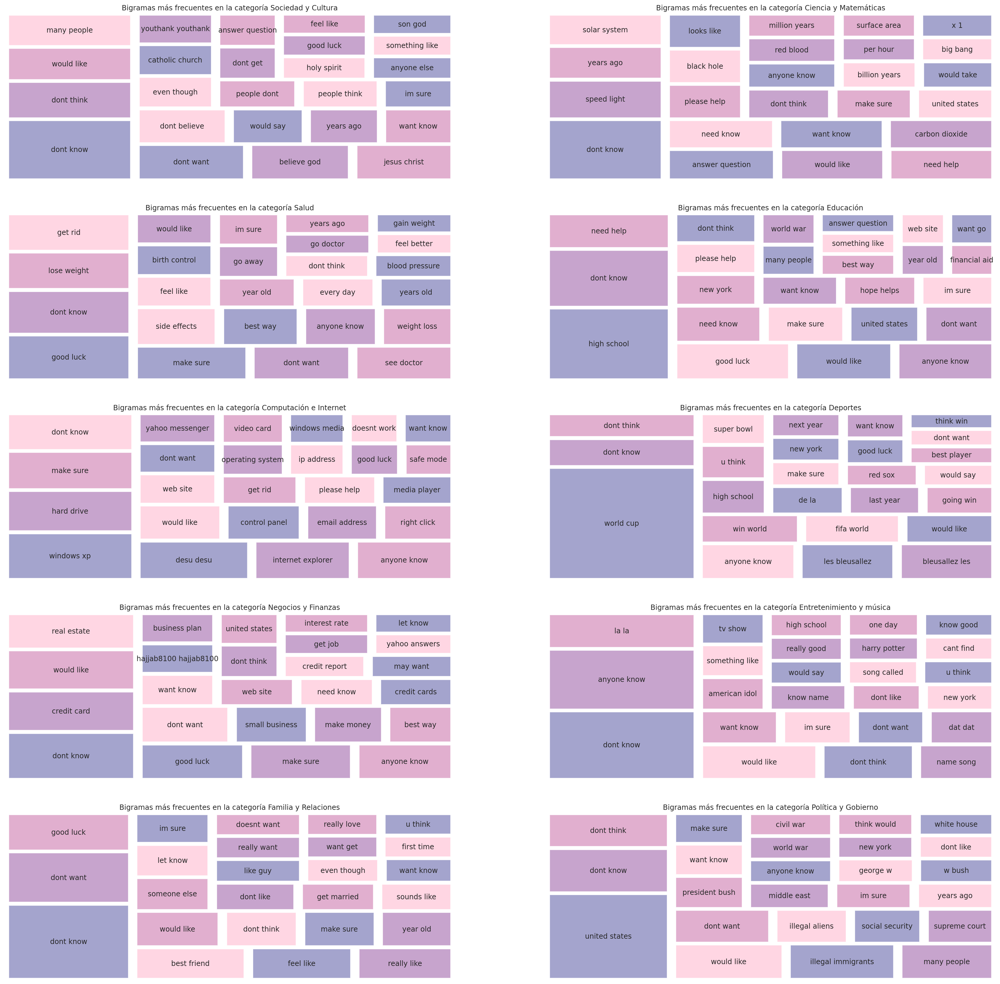

In [0]:
row = 5
col = 2
fig, axes = plt.subplots(row, col, figsize=(30,30))
subplots = [axe for array in axes for axe in array]
colors6 = ['#6867AC', '#A267AC', '#CE7BB0', '#FFBCD1']

for i, subplot in zip(range(row * col), subplots):
    histograma =most_freq_bis_list[i].take(25)
    numeros = [x[0] for x in histograma ]
    frecuencias = [x[1] for x in histograma ]
    size = frecuencias
    label = numeros
    squarify.plot(sizes=size, label=label, alpha=0.6, ax=subplot, pad = True, color=colors6)
    subplot.axis('off')
    subplot.set_title(f"Bigramas más frecuentes en la categoría {categories[i]}")

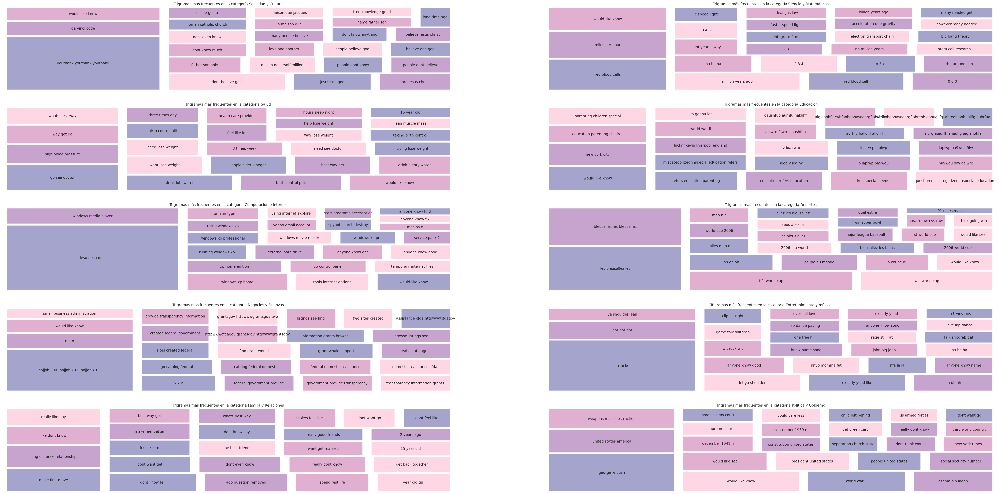

In [0]:
row = 5
col = 2
fig, axes = plt.subplots(row, col, figsize=(60,30))
subplots = [axe for array in axes for axe in array]
colors6 = ['#6867AC', '#A267AC', '#CE7BB0', '#FFBCD1']

for i, subplot in zip(range(row * col), subplots):
    histograma =most_freq_tris_list[i].take(25)
    numeros = [x[0] for x in histograma ]
    frecuencias =[x[1] for x in histograma ]
    size = frecuencias
    label = numeros
    squarify.plot(sizes=size, label=label, alpha=0.6, ax=subplot, pad = True, color=colors6)
    subplot.axis('off')
    subplot.set_title(f"Trigramas más frecuentes en la categoría {categories[i]}")

### Conclusiones y toma de decisiones

Después del estudio presentado, se propone y se concluye que;

1.- La comprensión del estudio del vocabulario y el filtrado por categorías podría resultar altamente valioso al generar proyectos tales como un chatbot y aplicaciones que empleen el Lenguaje de Procesamiento Natural. Debido a la cercanía de nuestro conjunto de datos al lenguaje informal y casual empleado en la red, esto podría acercar más a las personas y, por ejemplo, a los asistentes de chat/voz. 

2.- Gracias al estudio de las palabras y conjuntos de palabras más frecuentes, se podría emplear esta información para entender e identificar los "trending topics". Con esto, se podría ayudar a, por ejemplo, abrir hilos relacionados en Twitter o brindar ideas a los escritores de noticias en la web. 

3.- A través del entendimiento del lenguaje casual escrito, se pueden mejorar las recomendaciones de búsquedas en internet, así como ayudar a los motores de búsqueda a generar resultados que realmente se adecuen a la solicitud del usuario. 

4.- Más aún, mediante una implementación adecuada haciendo uso de la probabilidad y estadística, se podría codificar un clasificador de categorías por preguntas tomando en consideración, por ejemplo, los trigramas o bigramas más usados en cada categoría.

Realizó;

-Nolasco Cabello Bruce Adrián

-Ayala Salcedo Marlene Viviane

-Andrés Urbano Guillermo 

-Fuentes Cruz Luis Ariel